# Visualização combinada: modelo normal (RGB) + modelo from zero (`.npy`)

Mesmo fluxo dos notebooks `visualization_models_focus.ipynb` e `visualization_models_focus (from zero).ipynb`:

1. Carrega amostras de **`val/leprosy`** e **`val/outros`** (pares JPG + `.npy`)
2. Embaralha com `SHUFFLE_SEED`
3. Para cada imagem: imprime classe real/prevista e exibe Grad-CAM dos dois modelos
4. Ao final: **resumo geral** (acurácia, relatório e matrizes de confusão dos dois modelos)

O loop chama `cleanup_after_sample()` a cada imagem (fecha figuras, remove tensores temporários e roda `gc.collect()`) para reduzir uso de RAM/VRAM em execuções longas.


> **Importante:** após editar este notebook, use **Kernel → Restart & Run All** (não reexecute só a última célula).

Variáveis de ambiente opcionais: `CO2WOUNDS_MODEL`, `CO2WOUNDS_FROMZERO_MODEL`.

In [1]:
import gc
import os
import sys
import time

from collections import Counter
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image


def _resolve_project_root():
    """Sobe diretórios até encontrar utils/models_to_pkl.py (não depende do cwd do Jupyter)."""
    here = Path.cwd().resolve()
    for base in [here, *here.parents]:
        if (base / "utils" / "models_to_pkl.py").is_file():
            return str(base)
    raise FileNotFoundError("Raiz do repositório não encontrada (esperado utils/models_to_pkl.py).")


project_root = _resolve_project_root()
if project_root not in sys.path:
    sys.path.insert(0, project_root)

from utils.gradcam import find_last_spatial_layer_name, make_gradcam_heatmap, overlay_jet_on_rgb
from utils.models_to_pkl import load_model
from utils.tf_gpu import configure_gpu_memory_growth, log_gpu_status
from utils.visualization_samples import (
    CLASS_NAMES,
    format_probs_percent,
    list_val_paired_images,
    predicted_class,
    shuffle_samples,
)

configure_gpu_memory_growth()
log_gpu_status()

I0000 00:00:1779202784.917544  259005 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.



TensorFlow devices
  GPU count: 1
  [0] /physical_device:GPU:0
  CPU count: 1



I0000 00:00:1779202789.995797  259005 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 2555 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1650, pci bus id: 0000:01:00.0, compute capability: 7.5


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [2]:
RAW_VAL_ROOT = os.path.join(
    project_root, "data", "CO2Wounds-V2", "raw", "train_images_binary", "val"
)
NPY_VAL_ROOT = os.path.join(
    project_root,
    "data",
    "CO2Wounds-V2",
    "processed",
    "train_images_binary",
    "val",
)
SHUFFLE_SEED = 42  # None para ordem aleatória diferente a cada execução
MAX_IMAGES = None  # inteiro para limitar após embaralhar
CLEANUP_EVERY_N = 25  # gc.collect() extra a cada N amostras (None para desativar)

_model_rgb = os.environ.get("CO2WOUNDS_MODEL", "modelo_binario_co2wounds_transfer_raw")
_model_fromzero = os.environ.get(
    "CO2WOUNDS_FROMZERO_MODEL", "modelo_binario_co2wounds_fromzero_processed"
)

model_rgb = load_model(os.path.join(project_root, "models", _model_rgb))
model_fromzero = load_model(os.path.join(project_root, "models", _model_fromzero))

LAST_CONV_RGB = find_last_spatial_layer_name(model_rgb)
LAST_CONV_FROMZERO = find_last_spatial_layer_name(model_fromzero)
print("Grad-CAM RGB:", LAST_CONV_RGB)
print("Grad-CAM from zero:", LAST_CONV_FROMZERO)

✅ Modelo carregado de: /home/alyssandro/Documentos/Github/leprosy_classification_models-TCC/models/modelo_binario_co2wounds_transfer_raw.keras
✅ Modelo carregado de: /home/alyssandro/Documentos/Github/leprosy_classification_models-TCC/models/modelo_binario_co2wounds_fromzero_processed.keras
Grad-CAM RGB: conv5_block3_out
Grad-CAM from zero: conv5_block3_out


In [3]:
def get_rgb_array(img_path, size=(224, 224)):
    img = image.load_img(img_path, target_size=size)
    array = image.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    array = tf.keras.applications.resnet50.preprocess_input(array)
    return tf.constant(array, dtype=tf.float32)


def get_npy_array(img_path):
    img = np.load(img_path)
    if img.ndim == 2:
        img = img[..., np.newaxis]
    img = tf.image.resize(img.astype(np.float32), (224, 224)).numpy()
    return tf.constant(np.expand_dims(img, axis=0), dtype=tf.float32)


def npy_to_display_rgb(img_path):
    arr = np.load(img_path)
    if arr.ndim == 3:
        arr = arr[..., 0]
    arr = cv2.resize(arr, (224, 224))
    if arr.max() <= 1.0:
        v = np.clip(arr * 255.0, 0, 255).astype(np.uint8)
    else:
        v = np.clip(arr, 0, 255).astype(np.uint8)
    return np.stack([v, v, v], axis=-1)


def display_gradcam_fromzero(npy_path, heatmap, true_class, pred_class, probs):
    rgb = npy_to_display_rgb(npy_path)
    overlay = overlay_jet_on_rgb(rgb, heatmap, alpha=0.5, gamma=2.0, percentile=80)
    plt.figure(figsize=(12, 6))
    plt.suptitle(
        f"From zero — real: {true_class} | prevista: {pred_class}\n{format_probs_percent(probs)}",
        fontsize=11,
    )
    plt.subplot(1, 2, 1)
    plt.title("Canal Y (visualização)")
    plt.imshow(rgb)
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.title("Grad-CAM")
    plt.imshow(overlay)
    plt.axis("off")
    plt.tight_layout()
    plt.show()


def cleanup_after_sample(*tensors):
    """Libera figuras e tensores temporários para evitar acúmulo de RAM/VRAM."""
    plt.close("all")
    for t in tensors:
        del t
    gc.collect()


def display_gradcam_rgb(jpg_path, heatmap, true_class, pred_class, probs):
    img = image.load_img(jpg_path, target_size=(224, 224))
    rgb = np.asarray(img, dtype=np.uint8)
    overlay = overlay_jet_on_rgb(rgb, heatmap, alpha=0.5, gamma=2.0, percentile=80)
    plt.figure(figsize=(12, 6))
    plt.suptitle(
        f"RGB (transfer) — real: {true_class} | prevista: {pred_class}\n{format_probs_percent(probs)}",
        fontsize=11,
    )
    plt.subplot(1, 2, 1)
    plt.title("Imagem original (224×224)")
    plt.imshow(rgb)
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.title("Grad-CAM")
    plt.imshow(overlay)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

In [4]:
# Mesma lógica da célula de loop dos notebooks individuais
samples = list_val_paired_images(RAW_VAL_ROOT, NPY_VAL_ROOT)
if not samples:
    raise FileNotFoundError(
        f"Nenhum par raw+npy em val. Verifique:\n"
        f"  {RAW_VAL_ROOT}/leprosy e .../outros\n"
        f"  {NPY_VAL_ROOT}/leprosy e .../outros"
    )

samples = shuffle_samples(samples, seed=SHUFFLE_SEED)
if MAX_IMAGES is not None:
    samples = samples[: int(MAX_IMAGES)]

by_class = Counter(true for *_, true in samples)
print("RAW_VAL_ROOT:", RAW_VAL_ROOT)
print("NPY_VAL_ROOT:", NPY_VAL_ROOT)
print("Contagem por classe:", dict(by_class))
print(f"Processando {len(samples)} imagem(ns) de val (leprosy + outros), embaralhadas.")
if len(samples) < 700:
    raise RuntimeError(
        f"Esperado ~718 amostras em val; obteve {len(samples)}. "
        "Reinicie o kernel e execute todas as células (Run All)."
    )

RAW_VAL_ROOT: /home/alyssandro/Documentos/Github/leprosy_classification_models-TCC/data/CO2Wounds-V2/raw/train_images_binary/val
NPY_VAL_ROOT: /home/alyssandro/Documentos/Github/leprosy_classification_models-TCC/data/CO2Wounds-V2/processed/train_images_binary/val
Contagem por classe: {'outros': 596, 'leprosy': 122}
Processando 718 imagem(ns) de val (leprosy + outros), embaralhadas.


I0000 00:00:1779202803.267989  259907 service.cc:153] XLA service 0x7bb9a006bf10 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1779202803.268355  259907 service.cc:161]   StreamExecutor [0]: NVIDIA GeForce GTX 1650, Compute Capability 7.5 (Driver: 13.0.0; Runtime: 12.2.0; Toolkit: 12.5.0; DNN: 9.22.0)
I0000 00:00:1779202803.500716  259907 dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1779202805.135396  259907 cuda_dnn.cc:461] Loaded cuDNN version 92200
I0000 00:00:1779202814.951912  259907 device_compiler.h:208] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
/home/alyssandro/Documentos/Github/leprosy_classification_models-TCC/.venv/lib/python3.10/site-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received:

warts-common-1 — real: outros | from zero: outros | RGB: outros


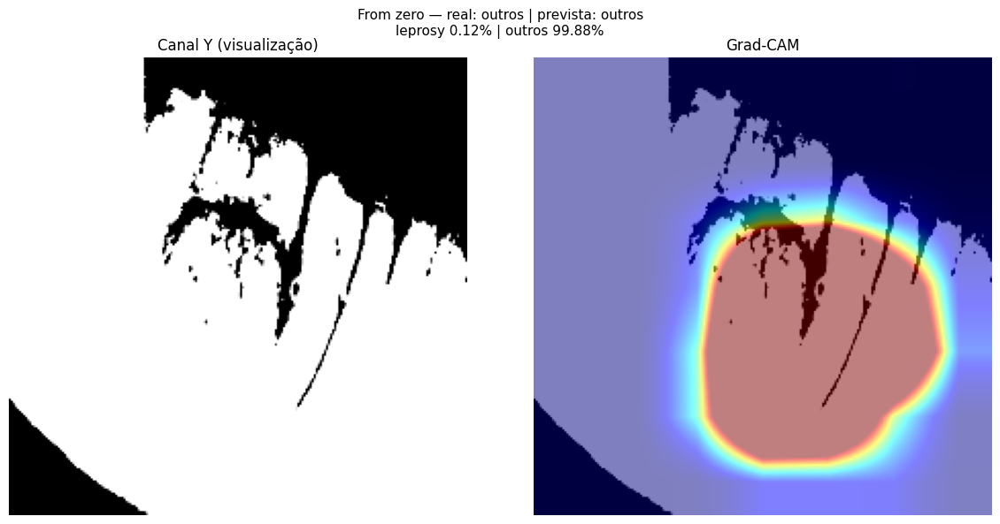

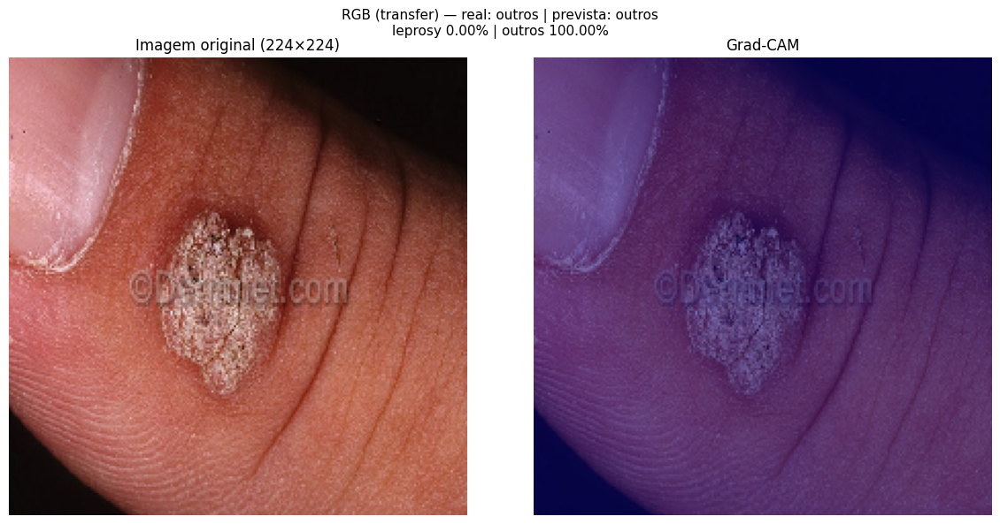

eczema-herpeticum-27 — real: outros | from zero: outros | RGB: outros


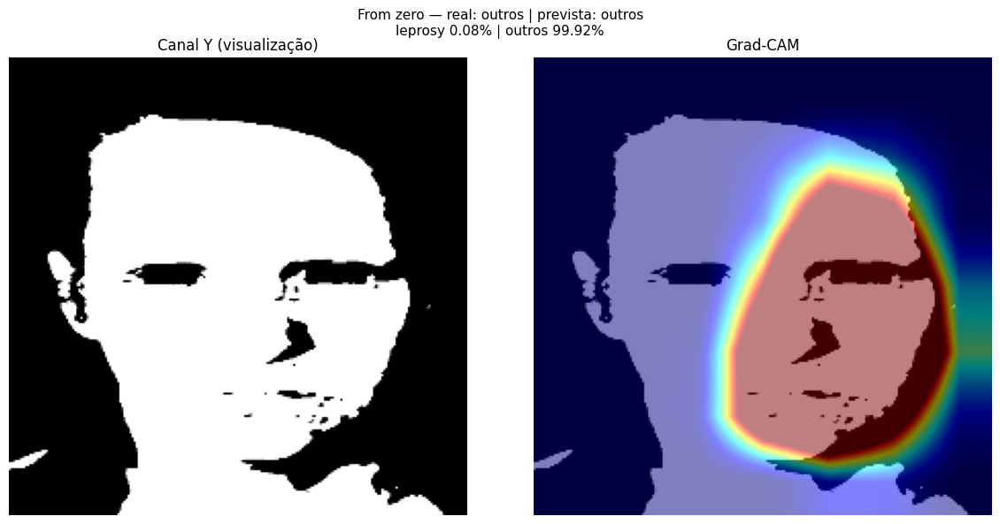

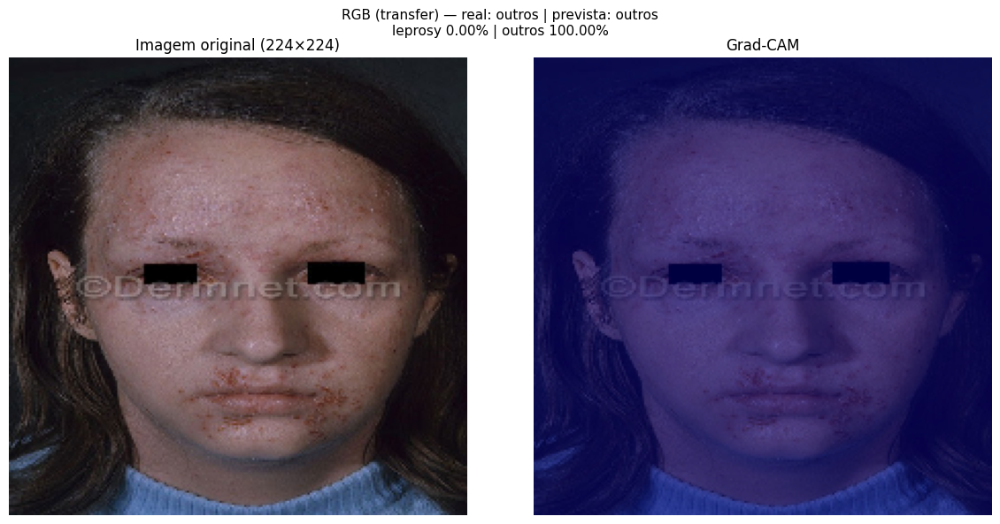

warts-common-56 — real: outros | from zero: outros | RGB: outros


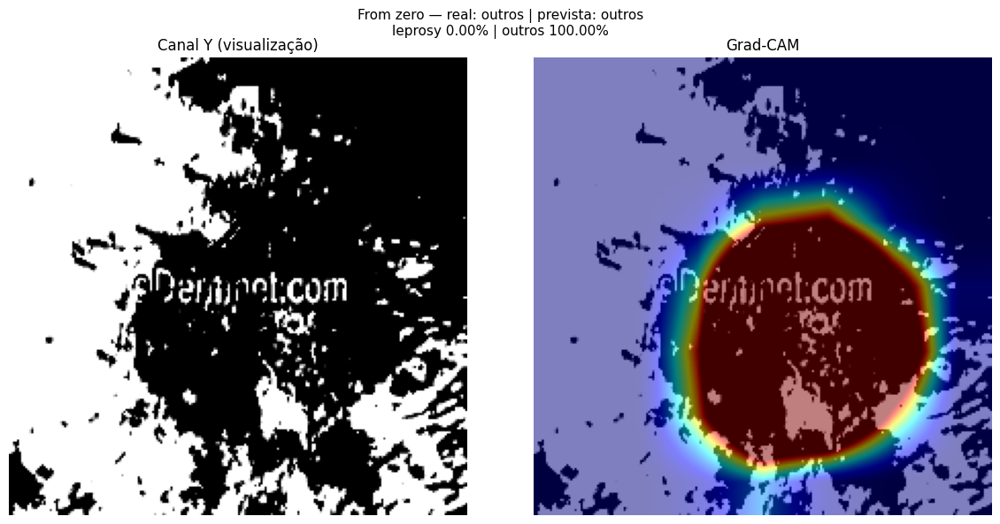

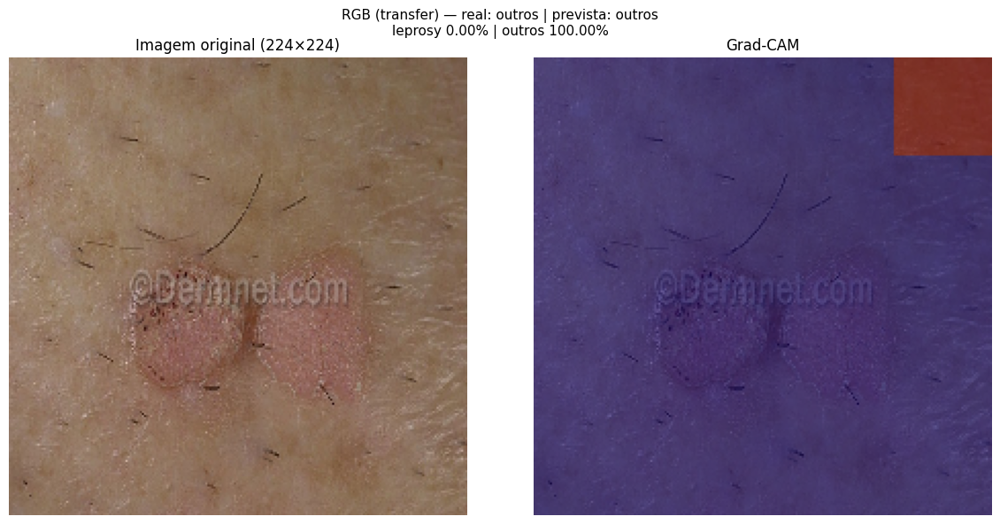

fixed-drug-eruption-22 — real: outros | from zero: outros | RGB: outros


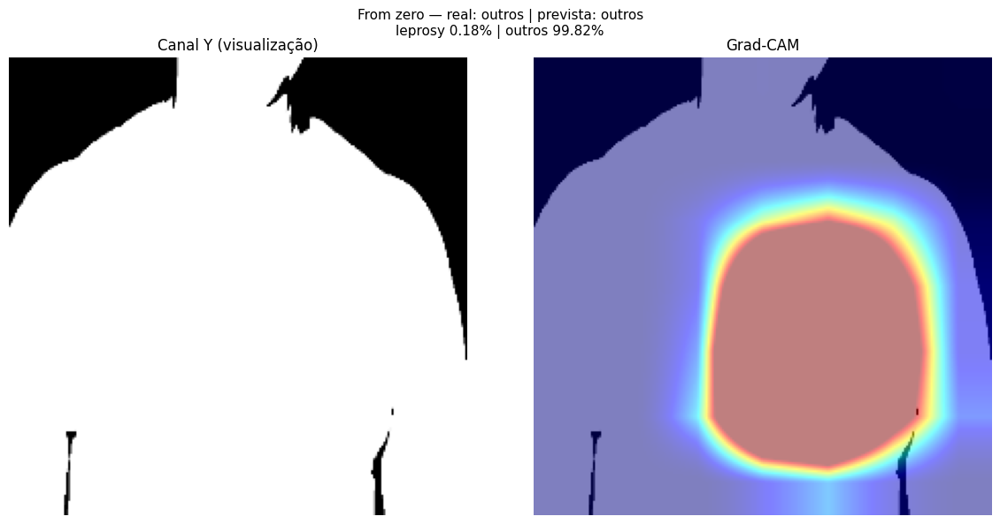

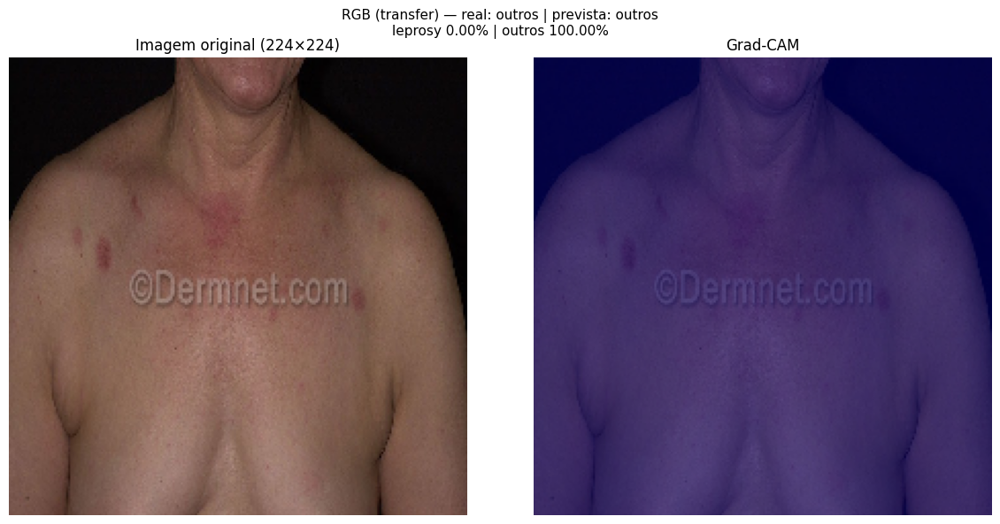

milia-14 — real: outros | from zero: outros | RGB: outros


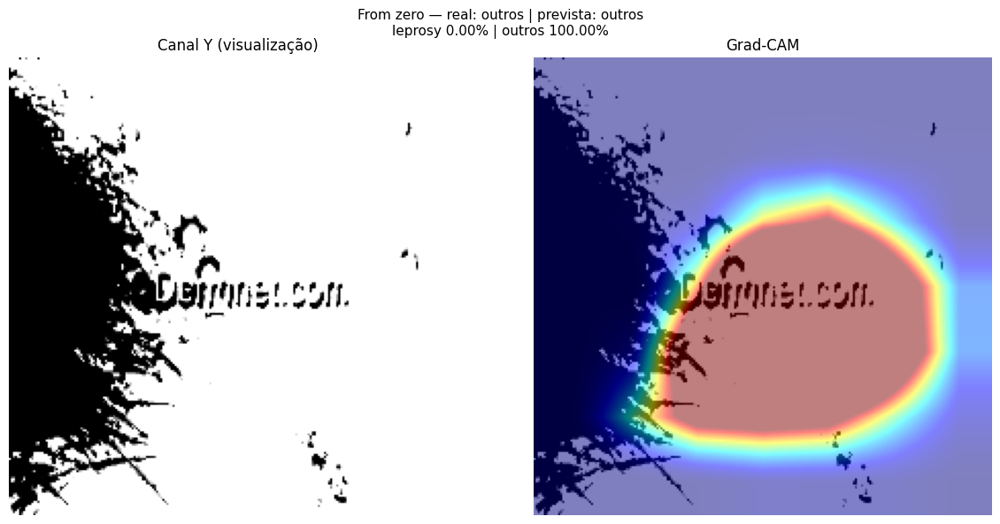

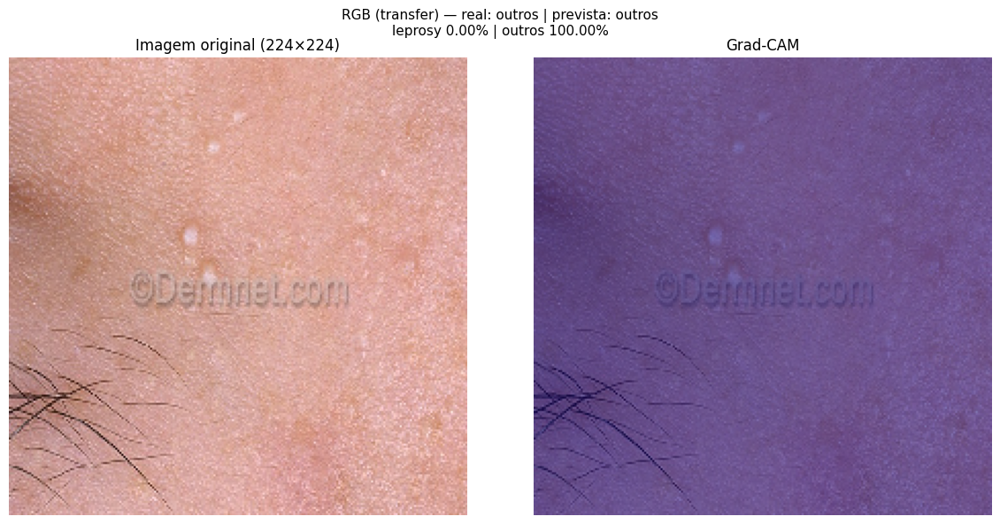

enterovirus-21 — real: outros | from zero: outros | RGB: outros


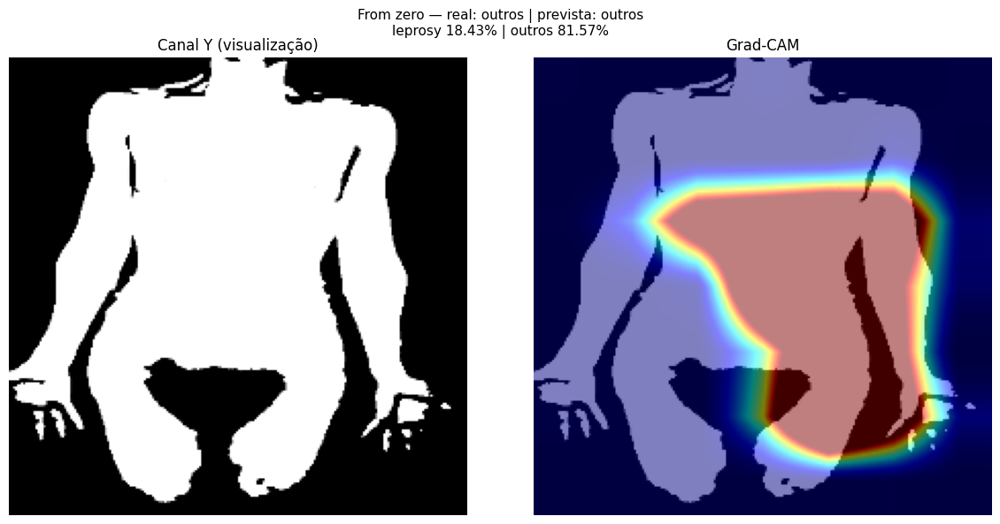

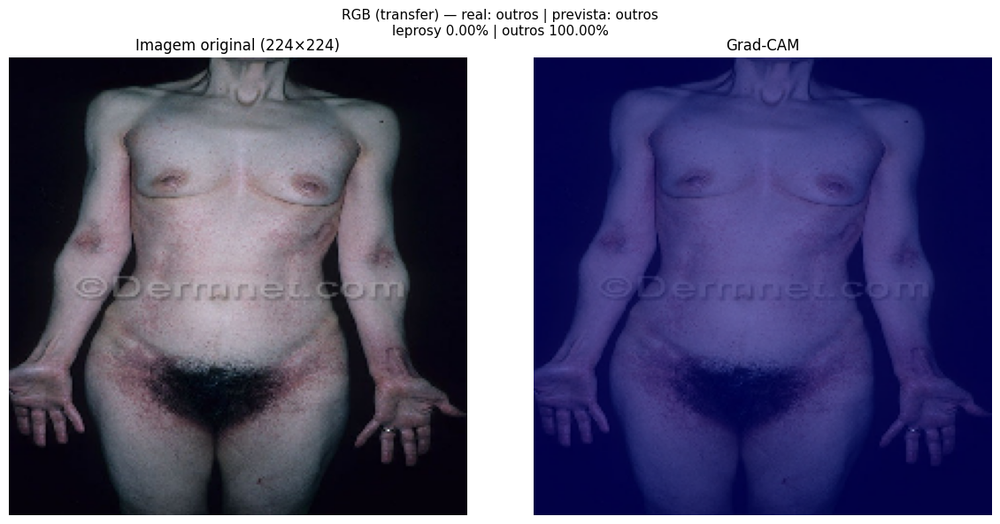

eczema-acute-5 — real: outros | from zero: outros | RGB: outros


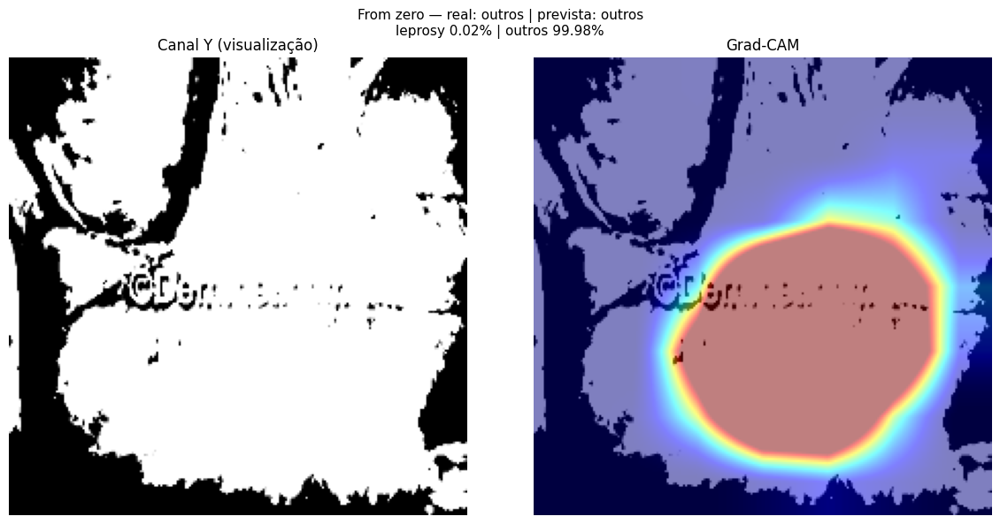

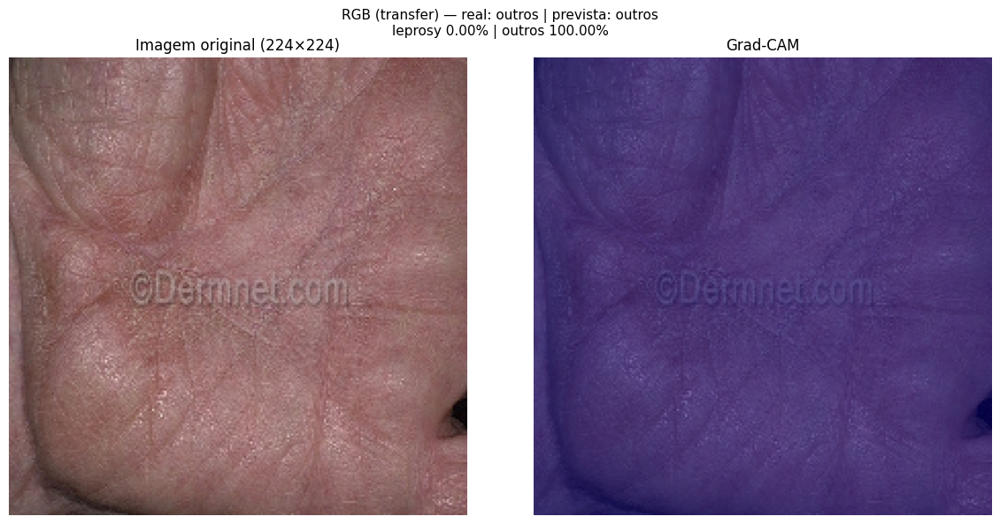

chronic-paronychia-41 — real: outros | from zero: outros | RGB: outros


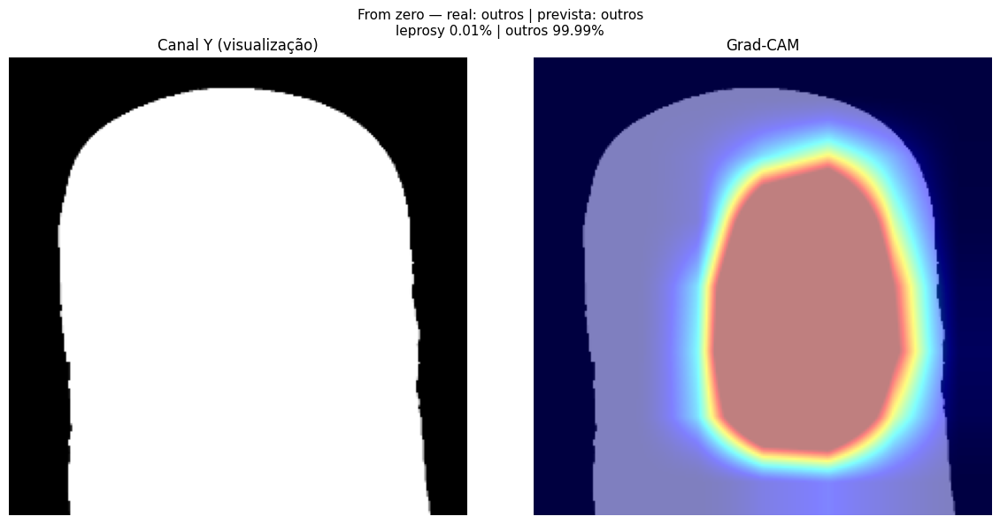

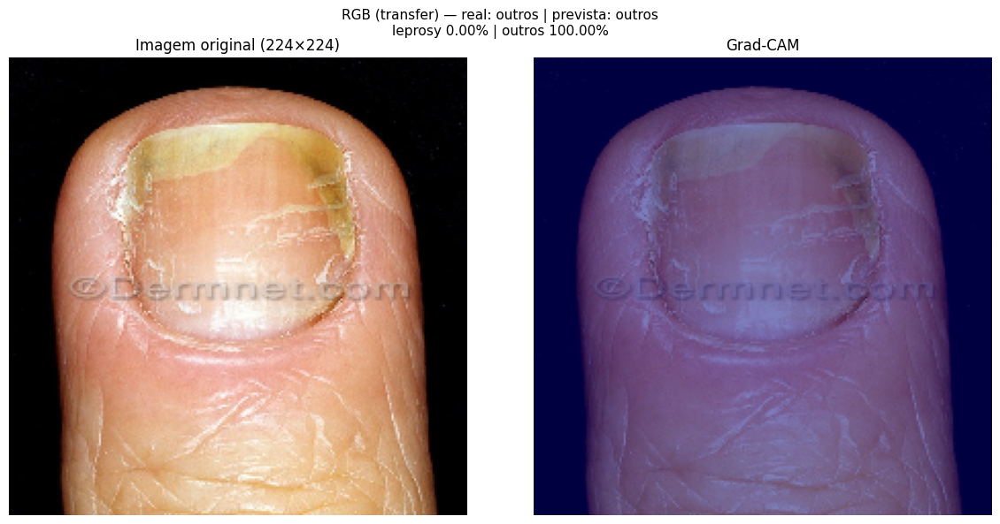

eczema-nummular-133 — real: outros | from zero: outros | RGB: outros


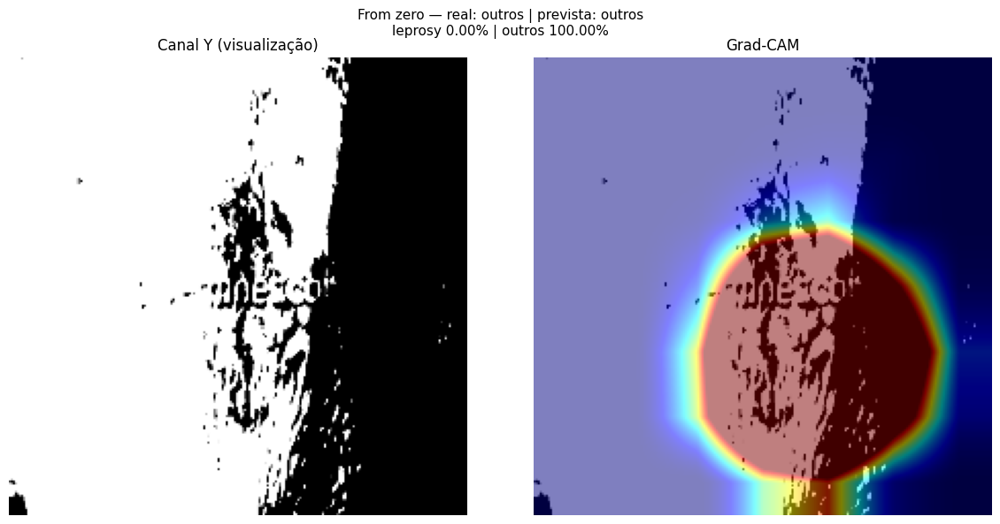

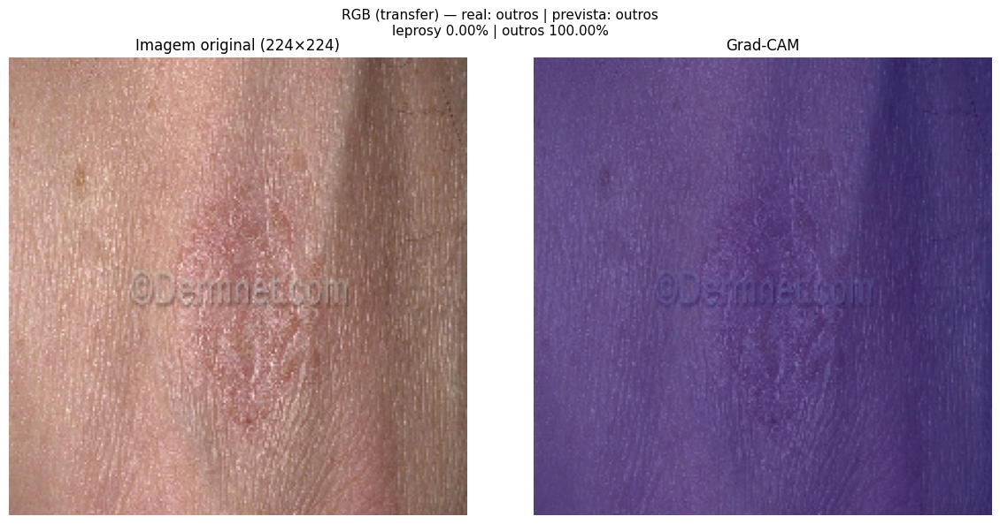

lupus-acute-40 — real: outros | from zero: outros | RGB: outros


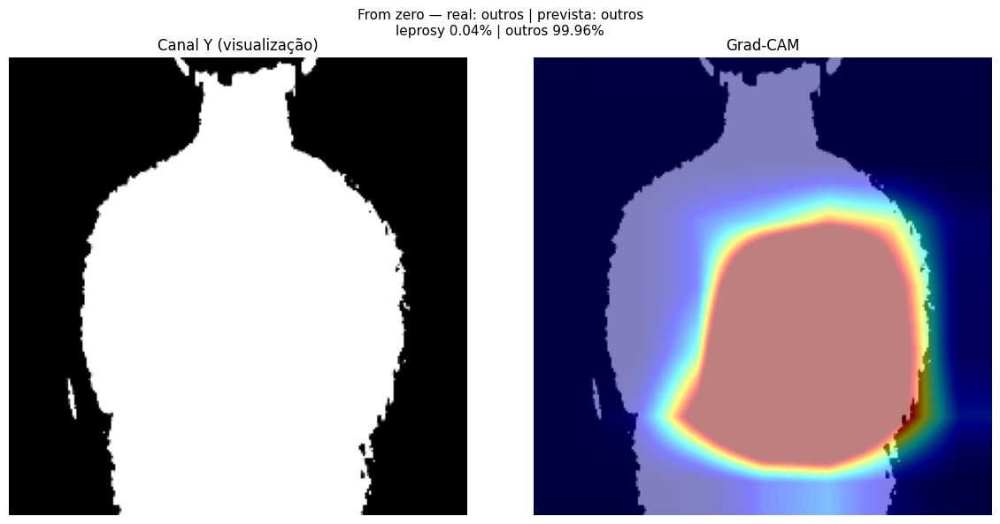

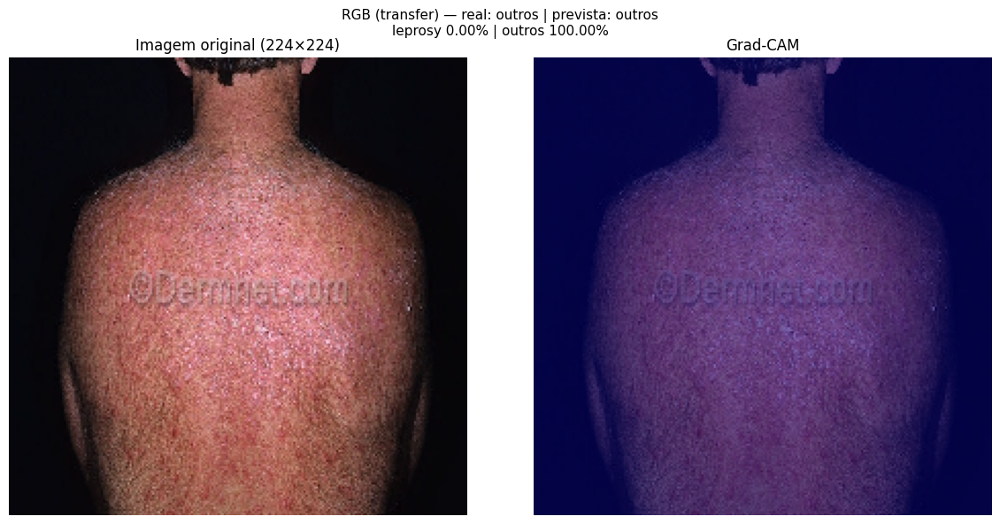

IMG1312 — real: leprosy | from zero: leprosy | RGB: leprosy


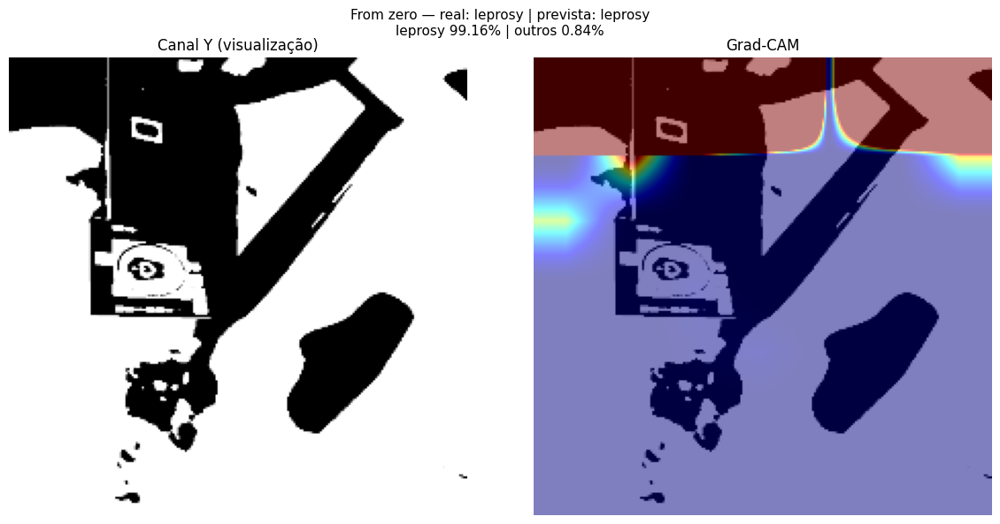

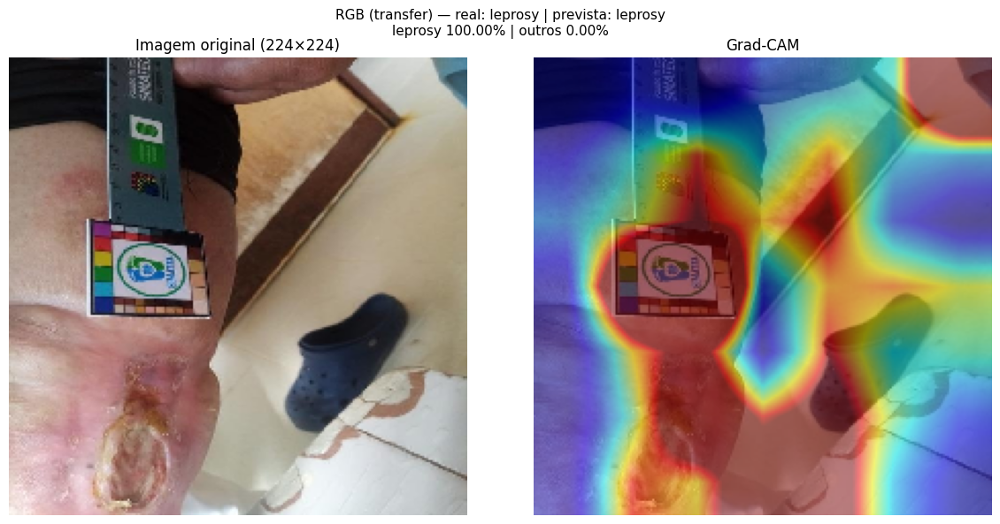

actinic-keratosis-horn-6 — real: outros | from zero: outros | RGB: outros


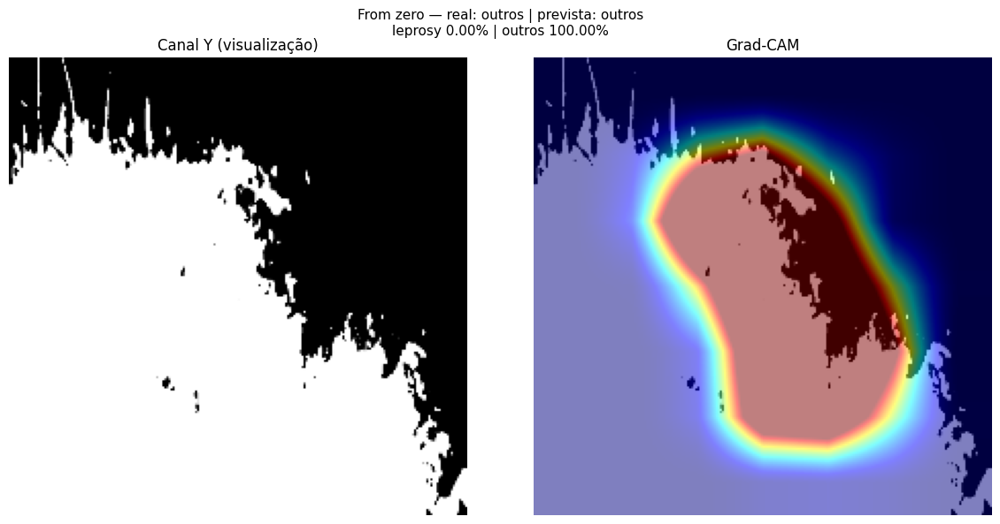

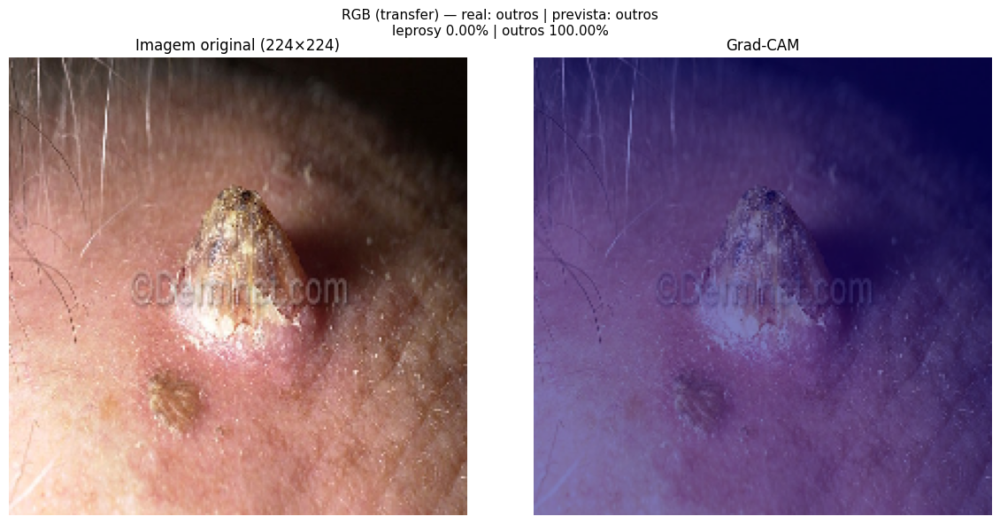

In [ ]:
results_true = []
results_pred_rgb = []
results_pred_fz = []

for idx, (stem, jpg_path, npy_path, true_class) in enumerate(samples):
    arr_fz = get_npy_array(npy_path)
    probs_fz = model_fromzero.predict(arr_fz, verbose=0)[0]
    pred_fz = predicted_class(probs_fz)
    heatmap_fz = make_gradcam_heatmap(
        arr_fz, model_fromzero, last_conv_layer_name=LAST_CONV_FROMZERO
    )

    arr_rgb = get_rgb_array(jpg_path)
    probs_rgb = model_rgb.predict(arr_rgb, verbose=0)[0]
    pred_rgb = predicted_class(probs_rgb)
    heatmap_rgb = make_gradcam_heatmap(
        arr_rgb, model_rgb, last_conv_layer_name=LAST_CONV_RGB
    )

    results_true.append(true_class)
    results_pred_fz.append(pred_fz)
    results_pred_rgb.append(pred_rgb)

    print(
        f"\033[94m{stem}\033[m — real: {true_class} | "
        f"from zero: {pred_fz} | RGB: {pred_rgb}"
    )
    display_gradcam_fromzero(npy_path, heatmap_fz, true_class, pred_fz, probs_fz)
    display_gradcam_rgb(jpg_path, heatmap_rgb, true_class, pred_rgb, probs_rgb)

    cleanup_after_sample(
        arr_fz, arr_rgb, heatmap_fz, heatmap_rgb, probs_fz, probs_rgb
    )
    if CLEANUP_EVERY_N and (idx + 1) % int(CLEANUP_EVERY_N) == 0:
        gc.collect()

    time.sleep(3)


In [1]:
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
)

if not results_true:
    raise RuntimeError(
        "Nenhuma amostra processada. Execute a célula do loop antes desta."
    )

_class_to_idx = {name: i for i, name in enumerate(CLASS_NAMES)}
y_true = np.array([_class_to_idx[c] for c in results_true])
y_pred_rgb = np.array([_class_to_idx[c] for c in results_pred_rgb])
y_pred_fz = np.array([_class_to_idx[c] for c in results_pred_fz])
n = len(y_true)

print("=" * 60)
print(f"Resultado geral — val ({n} amostras)")
print("=" * 60)

models_summary = [
    ("RGB (transfer)", y_pred_rgb, results_pred_rgb),
    ("From zero (.npy)", y_pred_fz, results_pred_fz),
]

for title, y_pred, _ in models_summary:
    acc = accuracy_score(y_true, y_pred)
    print(f"\n--- {title} ---")
    print(f"Acurácia: {acc * 100:.2f}% ({(y_pred == y_true).sum()}/{n} corretas)")
    print(
        classification_report(
            y_true,
            y_pred,
            target_names=list(CLASS_NAMES),
            zero_division=0,
        )
    )

both_correct = int(np.sum((y_pred_rgb == y_true) & (y_pred_fz == y_true)))
either_wrong = n - int(np.sum((y_pred_rgb == y_true) | (y_pred_fz == y_true)))
print("--- Comparação ---")
print(f"Ambos corretos: {both_correct}/{n} ({100 * both_correct / n:.2f}%)")
print(f"Ambos errados: {either_wrong}/{n} ({100 * either_wrong / n:.2f}%)")

fig, axes = plt.subplots(1, 2, figsize=(11, 4))
for ax, (title, y_pred, _) in zip(axes, models_summary):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(CLASS_NAMES))
    disp.plot(ax=ax, cmap="Blues", colorbar=False)
    acc = accuracy_score(y_true, y_pred)
    ax.set_title(f"{title}\nAcurácia {acc * 100:.1f}%")
plt.suptitle("Matrizes de confusão — val completo", fontsize=12)
plt.tight_layout()
plt.show()
plt.close(fig)
gc.collect()


NameError: name 'results_true' is not defined